In [1]:
# reload modules before executing cells
%load_ext autoreload
%autoreload 2

In [4]:

from tqdm.notebook import tqdm
import torch
from diffusers import StableDiffusionPipeline, DDIMScheduler
from diffusers import DiffusionPipeline, UNet2DConditionModel
from transformers import CLIPTextModel

import os
import numpy as np
from PIL import Image

In [5]:
LOW_RESOURCE = False 
NUM_DIFFUSION_STEPS = 50
GUIDANCE_SCALE = 7.5
MAX_NUM_WORDS = 77
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
model_id = "./logs/dog/prior_high_lr_again"
ldm_stable = StableDiffusionPipeline.from_pretrained(model_id).to(device)
tokenizer = ldm_stable.tokenizer

In [6]:
from ptp_utils import show_cross_attention
from prompt2prompt import AttentionControl, AttentionStore, AttentionReplace
from diffusion_pipeline import run_and_display

/opt/conda/envs/dreambooth2/lib/python3.11/site-packages/diffusers/models/cross_attention.py:30: FutureWarning: Importing from cross_attention is deprecated. Please import from diffusers.models.attention_processor instead.
  deprecate(


In [7]:
prompts = [
    "a <sks-dog> in the jungle",
    "a <sks-dog> in the snow", 
    "a <sks-dog> on the beach",
    "a <sks-dog> on top of a wooden floor",
    "a <sks-dog> with a mountain in the background",
    "a <sks-dog> with a city in the background",
    "a <sks-dog> with a blue house in the background",
    "a <sks-dog> wearing a red hat",
    "a <sks-dog> wearing a yellow shirt",
    "a <sks-dog> sitting near the window",
    "a <sks-dog> on top of green grass with sunflowers around it",
    "a <sks-dog> wearing a tuxedo",
    "a <sks-dog> walking on a red carpet on the beach",
    "a <sks-dog> on top of the sidewalk in a crowded city",
    "a <sks-dog> with the Taj Mahal in the background",
    "a <sks-dog> getting a bath",
    "a <sks-dog> surfing on a wave",
    "a <sks-dog> floating in space",
    "a <sks-dog> jumping in the air",
    "a <sks-dog> sleeping on a bed"
]

negative_prompt = len(prompts)*["low quality, blurry, unfinished"]

g_cpu = torch.Generator().manual_seed(0)
images = ldm_stable(prompts, num_images_per_prompt=1, output_type="pil", generator = g_cpu, negative_prompt = negative_prompt).images

  0%|          | 0/50 [00:00<?, ?it/s]

a <sks-dog> in the jungle


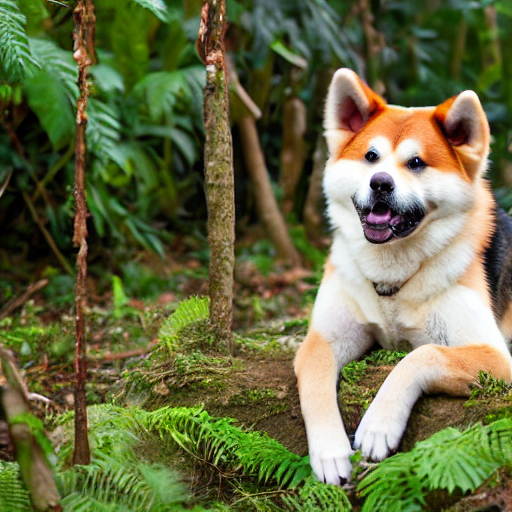

a <sks-dog> in the snow


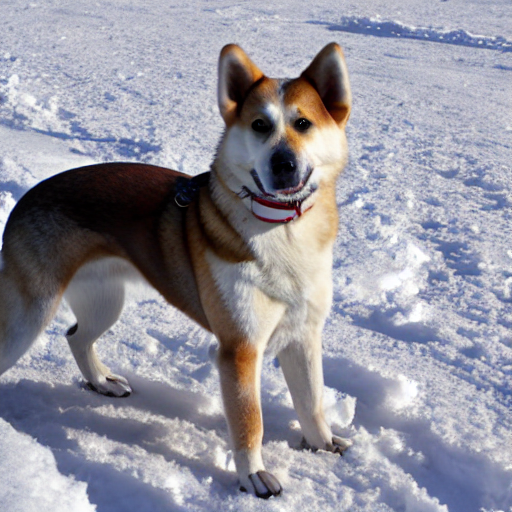

a <sks-dog> on the beach


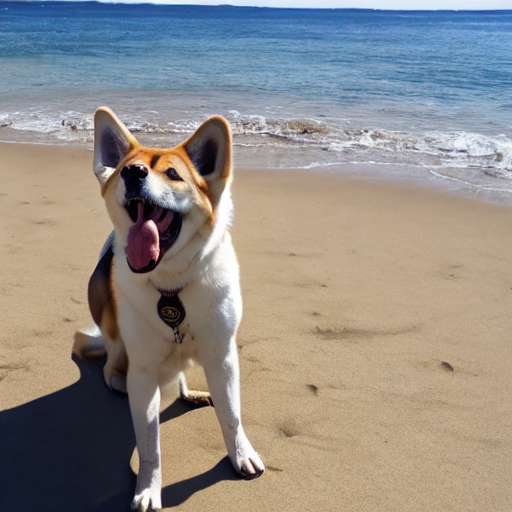

a <sks-dog> on top of a wooden floor


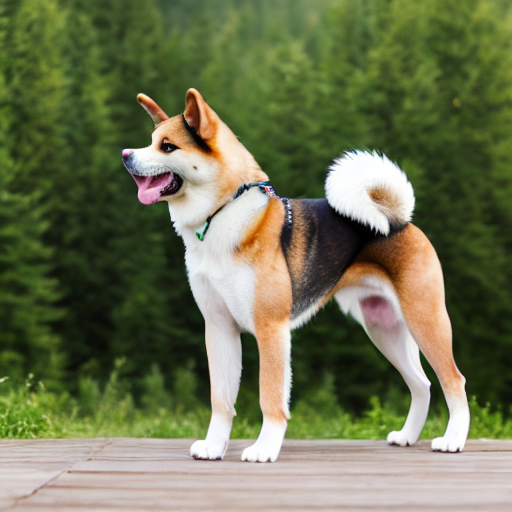

a <sks-dog> with a mountain in the background


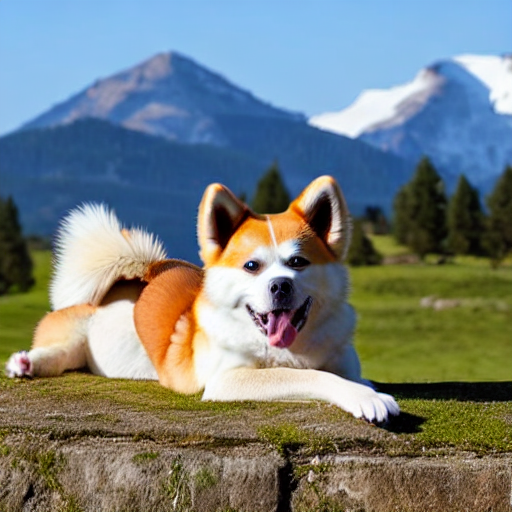

a <sks-dog> with a city in the background


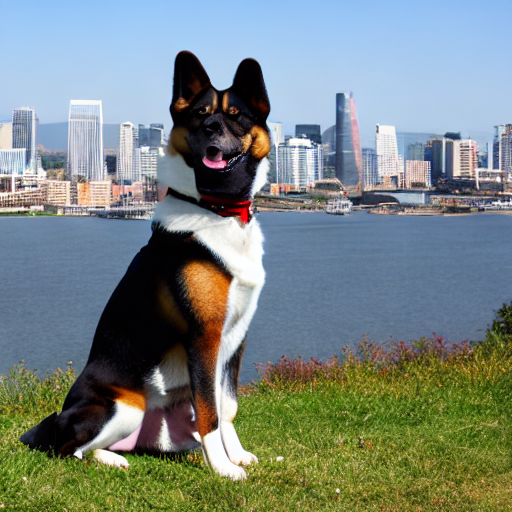

a <sks-dog> with a blue house in the background


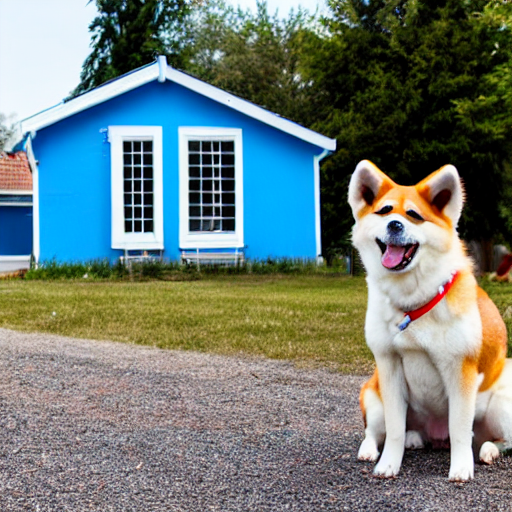

a <sks-dog> wearing a red hat


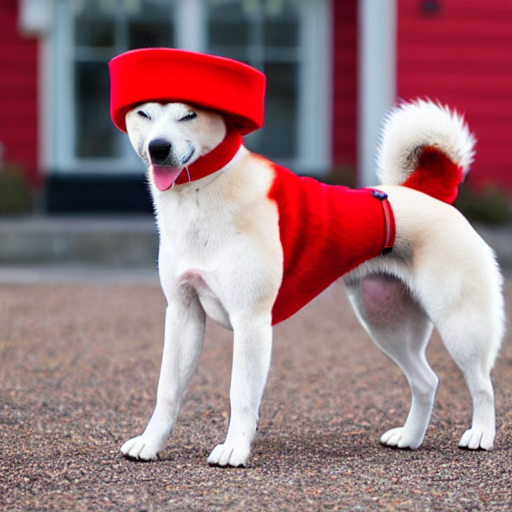

a <sks-dog> wearing a yellow shirt


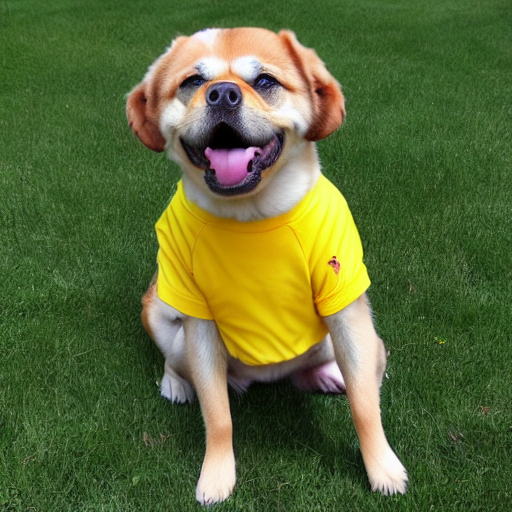

a <sks-dog> sitting near the window


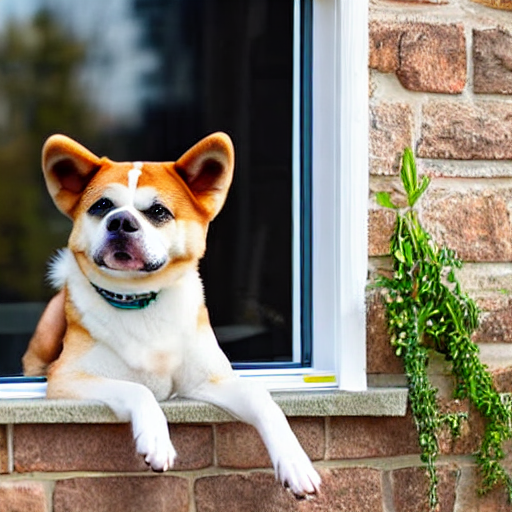

a <sks-dog> on top of green grass with sunflowers around it


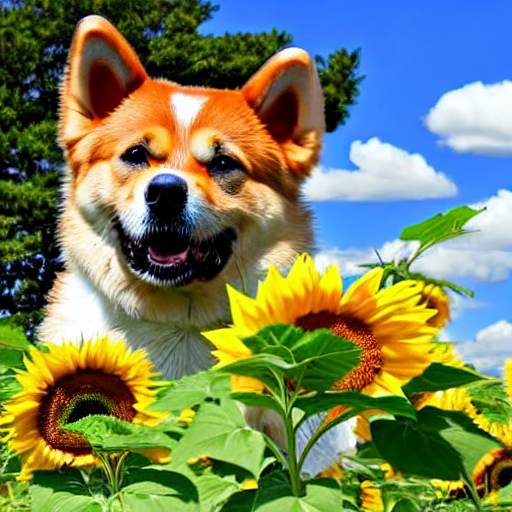

a <sks-dog> wearing a tuxedo


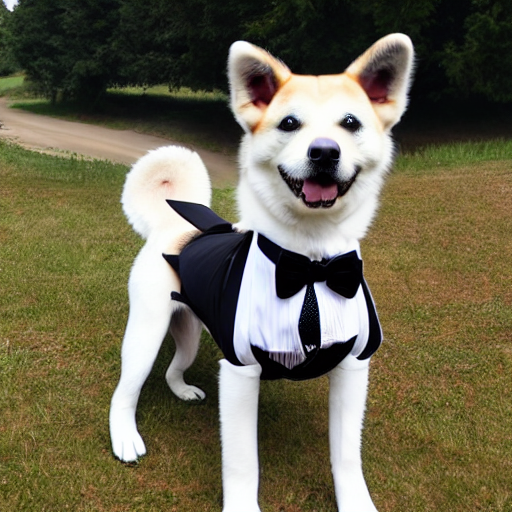

a <sks-dog> walking on a red carpet on the beach


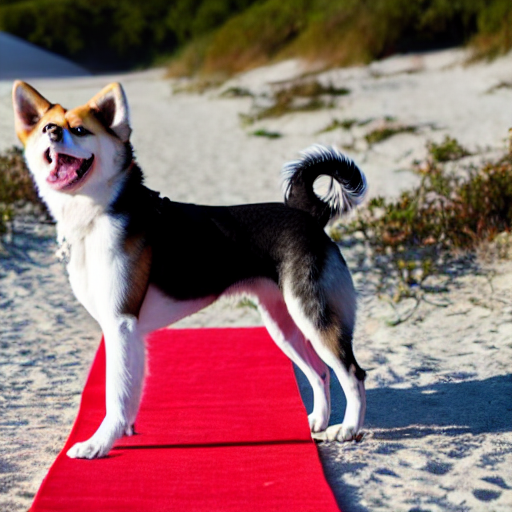

a <sks-dog> on top of the sidewalk in a crowded city


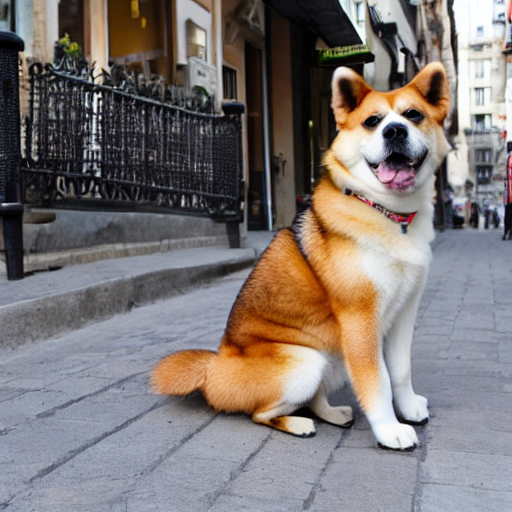

a <sks-dog> with the Taj Mahal in the background


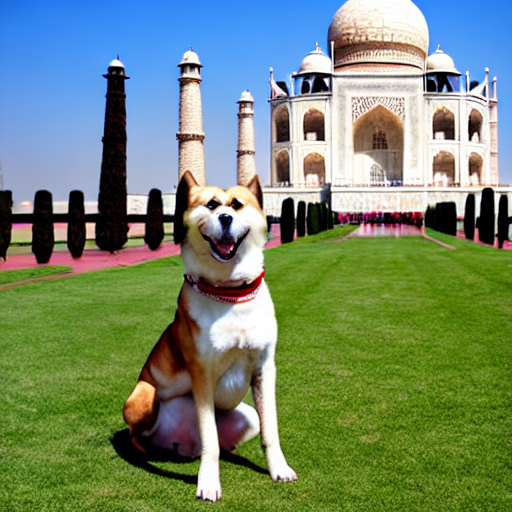

a <sks-dog> getting a bath


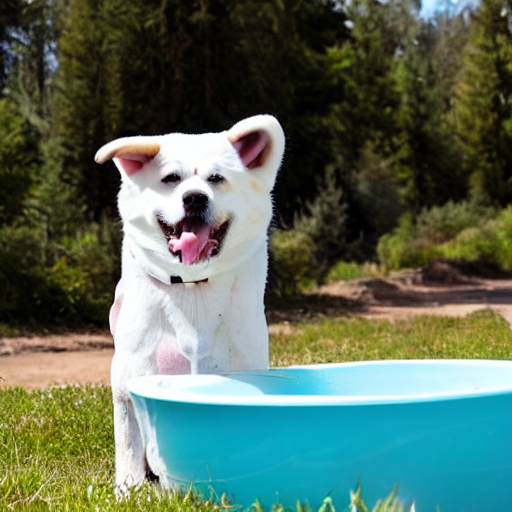

a <sks-dog> surfing on a wave


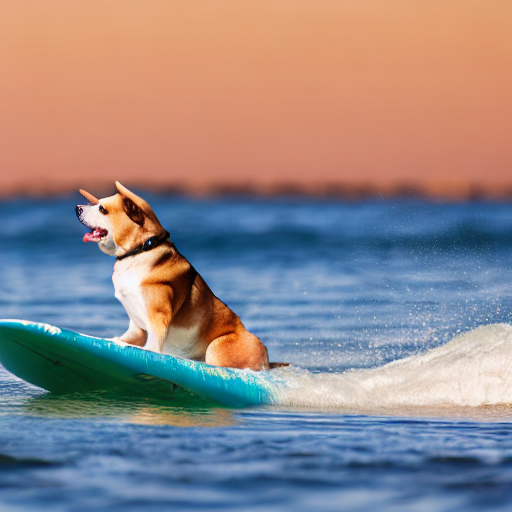

a <sks-dog> floating in space


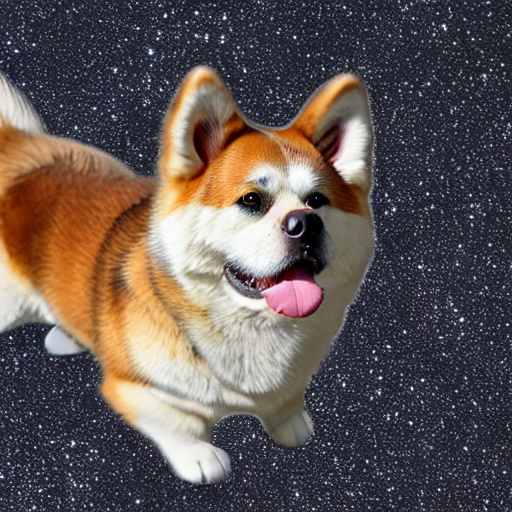

a <sks-dog> jumping in the air


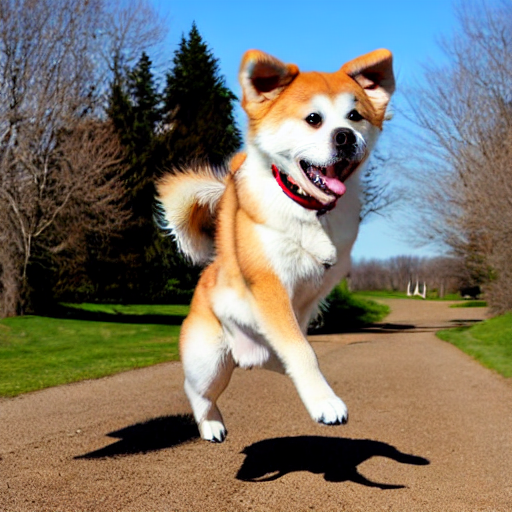

a <sks-dog> sleeping on a bed


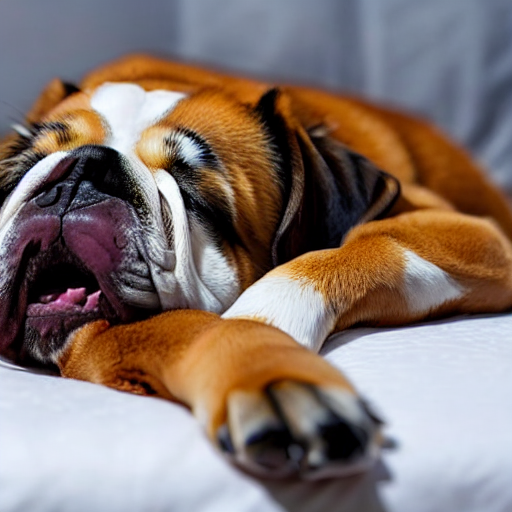

In [8]:
# plot and save pil images

save_dir = "results/dog/prior_high_lr_again"

os.makedirs(save_dir, exist_ok=True)

for prompt, image in zip(prompts, images):
    print(prompt)
    display(image)
    image.save(os.path.join(save_dir, prompt.replace(" ", "_") + ".png"))

In [9]:
from torchmetrics.functional.multimodal import clip_score
from functools import partial

clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")


def calculate_clip_score(images, prompts):
    images_int = (images * 255).astype("uint8")
    clip_score = clip_score_fn(torch.from_numpy(images_int).permute(0, 3, 1, 2), prompts).detach()
    return round(float(clip_score), 4)

images_np =[np.array(image) for image in images]
images_np = np.array(images_np)
sd_clip_score = calculate_clip_score(images_np, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 30.1439


In [ ]:
import torchvision

dataset_images = torchvision.ImageFolder(
    
)